<a href="https://colab.research.google.com/github/firekuo0803/Selflearning_AI/blob/main/torch_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### The first network

Net(
  (hidden): Linear(in_features=1, out_features=10, bias=True)
  (predict): Linear(in_features=10, out_features=1, bias=True)
)


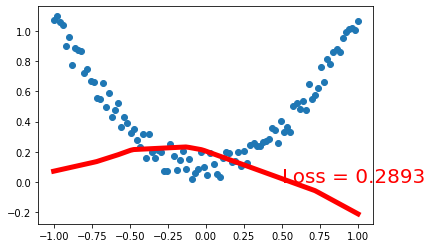

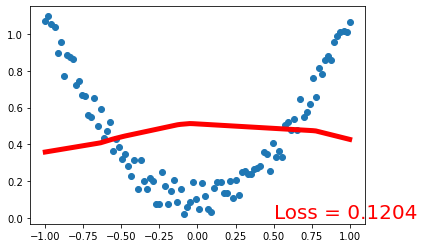

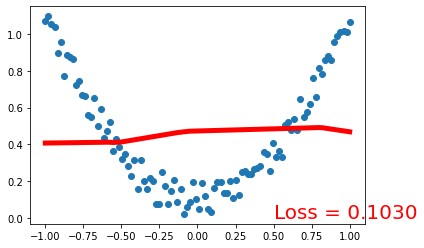

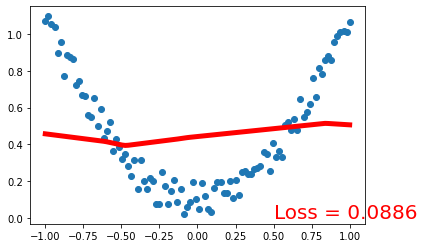

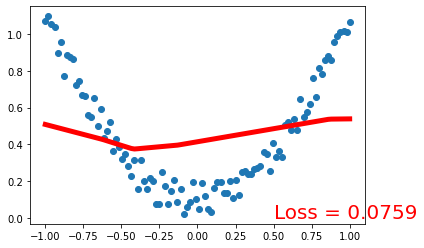

...

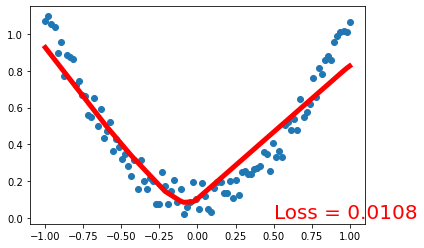

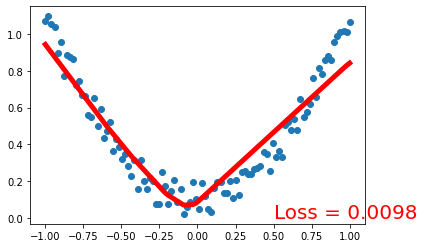

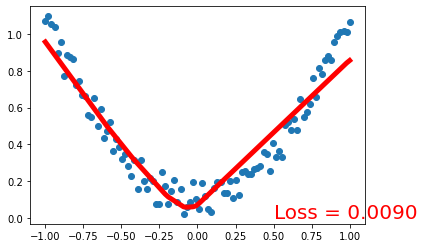

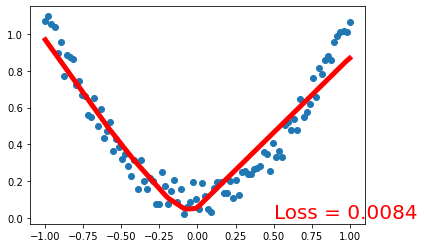

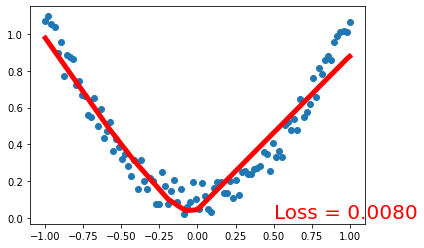

In [ ]:
import torch
from torch.autograd import Variable
import torch.nn.functional as F
import matplotlib.pyplot as plt

x = torch.unsqueeze(torch.linspace(-1, 1, 100), dim=1)
y = x.pow(2)+0.2*torch.rand(x.size())

x, y =Variable(x), Variable(y)

# plt.scatter(x.data.numpy(), y.data.numpy())
# plt.show()

class Net(torch.nn.Module):
  def __init__(self, n_feature, n_hidden, n_output):
    super(Net, self).__init__()
    self.hidden = torch.nn.Linear(n_feature, n_hidden)
    self.predict = torch.nn.Linear(n_hidden, n_output)

  def forward(self,x):
    x = F.relu(self.hidden(x))
    x = self.predict(x)
    return x

net = Net(1, 10, 1)
print(net)

optimizer = torch.optim.SGD(net.parameters(), lr =0.2) ##神經網絡參數 ，學習效率
loss_func = torch.nn.MSELoss()

plt.ion()

for t in range(100):
  prediction = net(x)

  loss = loss_func(prediction, y)

  optimizer.zero_grad()
  loss.backward()
  optimizer.step()

  if t%5 == 0:
    plt.cla()
    plt.scatter(x.data.numpy(), y.data.numpy())
    plt.plot(x.data.numpy(), prediction.data.numpy(), 'r-', lw=5)
    plt.text(0.5, 0, 'Loss = %.4f' % loss.data.numpy(), fontdict= {'size':20, 'color': 'red'})
    plt.pause(0.1)

plt.ioff()
plt.show()


###分類

Net(
  (hidden): Linear(in_features=2, out_features=10, bias=True)
  (predict): Linear(in_features=10, out_features=2, bias=True)
)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:50: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


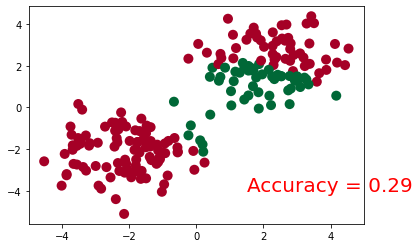

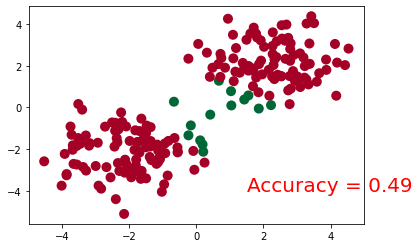

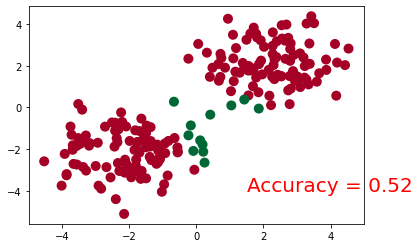

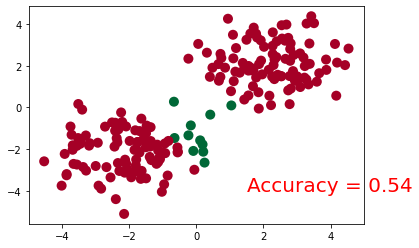

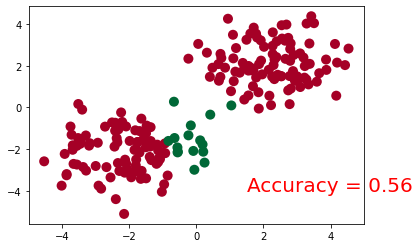

...

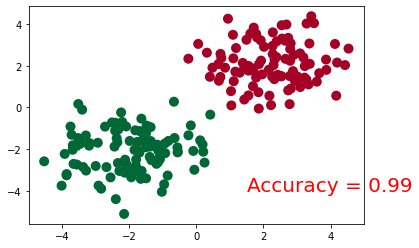

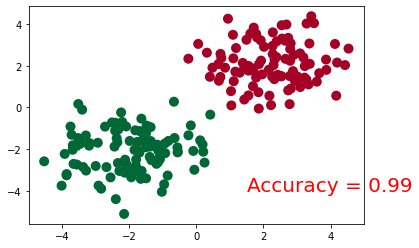

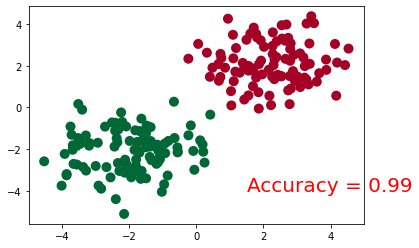

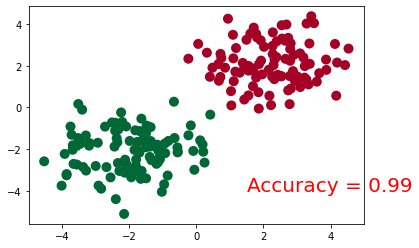

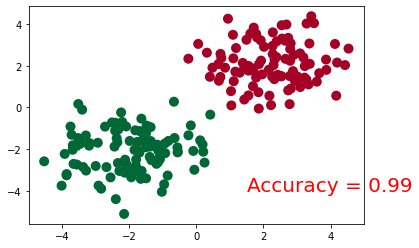

In [ ]:
from numpy.core.numeric import outer
import torch
from torch.autograd import Variable
import torch.nn.functional as F
import matplotlib.pyplot as plt

n_data = torch.ones(100, 2)
x0 = torch.normal(2*n_data, 1)
y0 = torch.zeros(100)
x1 = torch.normal(-2*n_data, 1)
y1 = torch.ones(100)
x = torch.cat((x0,x1),0).type(torch.FloatTensor)
y = torch.cat((y0,y1),).type(torch.LongTensor)

x, y =Variable(x), Variable(y)

# plt.scatter(x.data.numpy()[:, 0], x.data.numpy()[:, 1], c=y.data.numpy(), s=100, lw=0, cmap='RdYlGn')
# plt.show()

class Net(torch.nn.Module):
  def __init__(self, n_feature, n_hidden, n_output):
    super(Net, self).__init__()
    self.hidden = torch.nn.Linear(n_feature, n_hidden)
    self.predict = torch.nn.Linear(n_hidden, n_output)

  def forward(self,x):
    x = F.relu(self.hidden(x))
    x = self.predict(x)
    return x

net = Net(2, 10, 2)
print(net)

optimizer = torch.optim.SGD(net.parameters(), lr =0.02) ##神經網絡參數 ，學習效率
loss_func = torch.nn.CrossEntropyLoss()

plt.ion()

for t in range(100):
  out = net(x)

  loss = loss_func(out, y)

  optimizer.zero_grad()
  loss.backward()
  optimizer.step()

  if t%2 == 0:
    plt.cla()
    prediction = torch.max(F.softmax(out), 1)[1]
    pred_y = prediction.data.numpy()
    target_y = y.data.numpy()
    plt.scatter(x.data.numpy()[:,0], x.data.numpy()[:,1], c = pred_y, s=100, lw=0, cmap= 'RdYlGn')
    accuracy = float((pred_y == target_y).astype(int).sum())/float(target_y.size)
    plt.text(1.5, -4, 'Accuracy = %.2f' % accuracy, fontdict= {'size':20, 'color': 'red'})
    plt.pause(0.1)

plt.ioff()
plt.show()


###快速搭建法

In [ ]:
from numpy.core.numeric import outer
import torch
from torch.autograd import Variable
import torch.nn.functional as F
import matplotlib.pyplot as plt

#method 1
class Net(torch.nn.Module):
  def __init__(self, n_feature, n_hidden, n_output):
    super(Net, self).__init__()
    self.hidden = torch.nn.Linear(n_feature, n_hidden)
    self.predict = torch.nn.Linear(n_hidden, n_output)

  def forward(self,x):
    x = F.relu(self.hidden(x))
    x = self.predict(x)
    return x

net1 = Net(2, 10, 2)

#method 2
net = torch.nn.Sequential(
    torch.nn.Linear(2, 10),
    torch.nn.ReLU(),
    torch.nn.Linear(10,2)
)


###保存

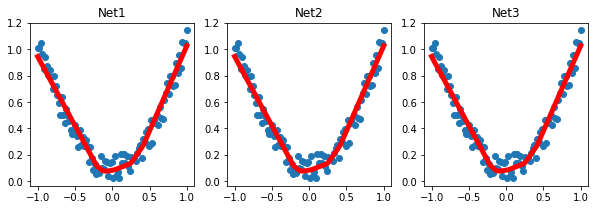

In [ ]:
import torch
import matplotlib.pyplot as plt

# torch.manual_seed(1)    # reproducible

# fake data
x = torch.unsqueeze(torch.linspace(-1, 1, 100), dim=1)  # x data (tensor), shape=(100, 1)
y = x.pow(2) + 0.2*torch.rand(x.size())  # noisy y data (tensor), shape=(100, 1)

# The code below is deprecated in Pytorch 0.4. Now, autograd directly supports tensors
# x, y = Variable(x, requires_grad=False), Variable(y, requires_grad=False)


def save():
    # save net1
    net1 = torch.nn.Sequential(
        torch.nn.Linear(1, 10),
        torch.nn.ReLU(),
        torch.nn.Linear(10, 1)
    )
    optimizer = torch.optim.SGD(net1.parameters(), lr=0.5)
    loss_func = torch.nn.MSELoss()

    for t in range(100):
        prediction = net1(x)
        loss = loss_func(prediction, y)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # plot result
    plt.figure(1, figsize=(10, 3))
    plt.subplot(131)
    plt.title('Net1')
    plt.scatter(x.data.numpy(), y.data.numpy())
    plt.plot(x.data.numpy(), prediction.data.numpy(), 'r-', lw=5)

    # 2 ways to save the net
    torch.save(net1, 'net.pkl')  # save entire net
    torch.save(net1.state_dict(), 'net_params.pkl')   # save only the parameters


def restore_net():
    # restore entire net1 to net2
    net2 = torch.load('net.pkl')
    prediction = net2(x)

    # plot result
    plt.subplot(132)
    plt.title('Net2')
    plt.scatter(x.data.numpy(), y.data.numpy())
    plt.plot(x.data.numpy(), prediction.data.numpy(), 'r-', lw=5)


def restore_params():
    # restore only the parameters in net1 to net3
    net3 = torch.nn.Sequential(
        torch.nn.Linear(1, 10),
        torch.nn.ReLU(),
        torch.nn.Linear(10, 1)
    )

    # copy net1's parameters into net3
    net3.load_state_dict(torch.load('net_params.pkl'))
    prediction = net3(x)

    # plot result
    plt.subplot(133)
    plt.title('Net3')
    plt.scatter(x.data.numpy(), y.data.numpy())
    plt.plot(x.data.numpy(), prediction.data.numpy(), 'r-', lw=5)
    plt.show()

# save net1
save()

# restore entire net (may slow)
restore_net()

# restore only the net parameters
restore_params()

###批數據訓練

In [ ]:
import torch
import torch.utils.data as Data

BATCH_SIZE = 5

x = torch.linspace(1, 10, 10)
y = torch.linspace(10, 1, 10)

torch_dataset = Data.TensorDataset(x, y)
loader = Data.DataLoader(
    dataset=torch_dataset,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # random shuffle for training
    num_workers=2,              # subprocesses for loading data
)


def show_batch():
    for epoch in range(3):   # train entire dataset 3 times
        for step, (batch_x, batch_y) in enumerate(loader):  # for each training step
            # train your data...
            print('Epoch: ', epoch, '| Step: ', step, '| batch x: ',
                  batch_x.numpy(), '| batch y: ', batch_y.numpy())


if __name__ == '__main__':
    show_batch()




Epoch:  0 | Step:  0 | batch x:  [10.  5.  1.  8.  3.] | batch y:  [ 1.  6. 10.  3.  8.]
Epoch:  0 | Step:  1 | batch x:  [6. 7. 9. 4. 2.] | batch y:  [5. 4. 2. 7. 9.]
Epoch:  1 | Step:  0 | batch x:  [ 9.  6. 10.  7.  8.] | batch y:  [2. 5. 1. 4. 3.]
Epoch:  1 | Step:  1 | batch x:  [2. 5. 4. 1. 3.] | batch y:  [ 9.  6.  7. 10.  8.]
Epoch:  2 | Step:  0 | batch x:  [ 6.  9.  8. 10.  4.] | batch y:  [5. 2. 3. 1. 7.]
Epoch:  2 | Step:  1 | batch x:  [2. 7. 1. 3. 5.] | batch y:  [ 9.  4. 10.  8.  6.]


###優化器

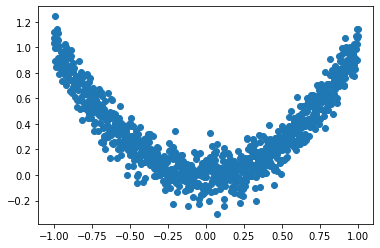

0
1
2
3
4
5
6
7
8
9
10
11


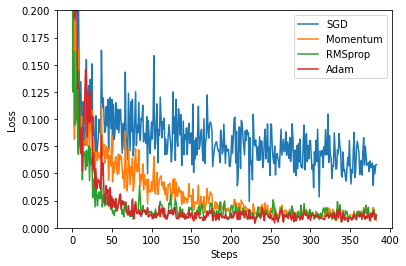

In [ ]:
import torch
import torch.utils.data as Data
import torch.nn.functional as F
from torch.autograd import Variable
import matplotlib.pyplot as plt

LR = 0.01
BATCH_SIZE = 32
EPOCH = 12

x = torch.unsqueeze(torch.linspace(-1, 1, 1000), dim=1)
y = x.pow(2) + 0.1*torch.normal(torch.zeros(*x.size()))

plt.scatter(x.numpy(), y.numpy())
plt.show()

torch_dataset = Data.TensorDataset(x, y)
loader = Data.DataLoader(
    dataset=torch_dataset,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # random shuffle for training
    num_workers=2,              # subprocesses for loading data
)

class Net(torch.nn.Module):
  def __init__(self):
    super(Net, self).__init__()
    self.hidden = torch.nn.Linear(1, 20)
    self.predict = torch.nn.Linear(20, 1)

  def forward(self,x):
    x = F.relu(self.hidden(x))
    x = self.predict(x)
    return x

net_SGD = Net()
net_Momentum = Net()
net_RMSprop = Net()
net_Adam = Net()
nets = [net_SGD, net_Momentum, net_RMSprop, net_Adam]

opt_SGD = torch.optim.SGD(net_SGD.parameters(), lr = LR)
opt_Momentum = torch.optim.SGD(net_Momentum.parameters(), lr = LR, momentum = 0.8)
opt_RMSprop = torch.optim.RMSprop(net_RMSprop.parameters(), lr = LR, alpha = 0.9)
opt_Adam = torch.optim.Adam(net_Adam.parameters(), lr = LR, betas= (0.9, 0.99))
optimizers = [opt_SGD, opt_Momentum, opt_RMSprop, opt_Adam]

loss_func = torch.nn.MSELoss()
losses_his = [[],[],[],[]]

for epoch in range(EPOCH):
  print(epoch)
  for step, (batch_x, batch_y) in enumerate(loader):
    b_x = Variable(batch_x)
    b_y = Variable(batch_y)

    for net, opt, l_his in zip(nets, optimizers, losses_his):
      output = net(b_x)
      loss = loss_func(output, b_y)
      opt.zero_grad()
      loss.backward()
      opt.step()
      l_his.append(loss.data.numpy())

labels = ['SGD', 'Momentum', 'RMSprop', 'Adam']
for i, l_his in enumerate(losses_his):
  plt.plot(l_his, label = labels[i])
plt.legend(loc = 'best')
plt.xlabel('Steps')
plt.ylabel('Loss')
plt.ylim((0,0.2))
plt.show()

###CNN

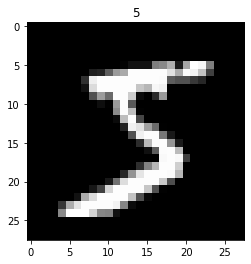

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.


EpochL 0 |train loss:2.2965 |test accuracy: 0.16
EpochL 0 |train loss:0.4583 |test accuracy: 0.80
EpochL 0 |train loss:0.1482 |test accuracy: 0.88
EpochL 0 |train loss:0.2239 |test accuracy: 0.92
EpochL 0 |train loss:0.1062 |test accuracy: 0.93
EpochL 0 |train loss:0.0686 |test accuracy: 0.93
EpochL 0 |train loss:0.2505 |test accuracy: 0.94
EpochL 0 |train loss:0.4210 |test accuracy: 0.96
EpochL 0 |train loss:0.0389 |test accuracy: 0.96
EpochL 0 |train loss:0.0302 |test accuracy: 0.97
EpochL 0 |train loss:0.1293 |test accuracy: 0.94
EpochL 0 |train loss:0.0665 |test accuracy: 0.97
EpochL 0 |train loss:0.0851 |test accuracy: 0.96
EpochL 0 |train loss:0.0793 |test accuracy: 0.97
EpochL 0 |train loss:0.1000 |test accuracy: 0.96
EpochL 0 |train loss:0.0148 |test accuracy: 0.98
EpochL 0 |train loss:0.0274 |test accuracy: 0.97
EpochL 0 |train loss:0.0505 |test accuracy: 0.97
EpochL 0 |train loss:0.1820 |test accuracy: 0.98
EpochL 0 |train loss:0.0223 |test accuracy: 0.98
EpochL 0 |train loss

In [ ]:
import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.utils.data as Data
import torchvision
import matplotlib.pyplot as plt

EPOCH = 1
BATCH_SIZE = 50
LR = 0.001
DOWNLOAD_MNIST = False

train_data = torchvision.datasets.MNIST(
    root='./mnist',
    train=True,
    transform = torchvision.transforms.ToTensor(),
    download = DOWNLOAD_MNIST
)

plt.imshow(train_data.train_data[0].numpy(), cmap='gray')
plt.title('%i'%train_data.train_labels[0])
plt.show()

train_loader = Data.DataLoader(
    dataset=train_data,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # random shuffle for training
    num_workers=2,              # subprocesses for loading data
)

test_data = torchvision.datasets.MNIST(root = './mnist/', train = False)
test_x = Variable(torch.unsqueeze(test_data.test_data, dim = 1), volatile = True).type(torch.FloatTensor)[:2000]/255.
test_y = test_data.test_labels[:2000]

class CNN(nn.Module):
  def __init__(self):
    super(CNN,self).__init__()
    self.conv1 = nn.Sequential(
        nn.Conv2d(
            in_channels = 1,
            out_channels =16,
            kernel_size = 5,
            stride = 1,
            padding = 2 #if stride = 1, padding = (kernel_size-1)/2 = (5-1)/2
        ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2)
    )
    self.conv2 = nn.Sequential(
        nn.Conv2d(16, 32, 5, 1, 2),
        nn.ReLU(),
        nn.MaxPool2d(2)
    )
    self.out = nn.Linear(32*7*7, 10)
  def forward(self, x):
    x = self.conv1(x)
    x = self.conv2(x)
    x = x.view(x.size(0), -1)
    output = self.out(x)
    return output

cnn = CNN()
optimizer = torch.optim.Adam(cnn.parameters(), lr=LR)
loss_func = nn.CrossEntropyLoss()

for epoch in range(EPOCH):
  for step, (x, y) in enumerate(train_loader):
    b_x = Variable(x)
    b_y = Variable(y)

    output = cnn(b_x)
    loss = loss_func(output, b_y)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if step % 50 == 0:
      test_output = cnn(test_x)
      pred_y = torch.max(test_output, 1)[1].data.squeeze()
      accuracy = sum(pred_y == test_y)/test_y.size(0)
      print('EpochL', epoch, '|train loss:%.4f' %loss.data.numpy(), '|test accuracy: %.2f' % accuracy)

test_output = cnn(test_x[:10])
pred_y = torch.max(test_output, 1)[1].data.numpy().squeeze()
print(pred_y, 'prediction number')
print(test_y[:10].numpy(), 'real number')

###RNN分類

torch.Size([60000, 28, 28])
torch.Size([60000])


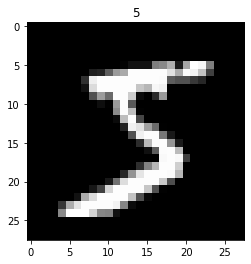

RNN(
  (rnn): LSTM(28, 64, batch_first=True)
  (out): Linear(in_features=64, out_features=10, bias=True)
)
EpochL 0 |train loss:2.3009 |test accuracy: 0.13
EpochL 0 |train loss:0.9031 |test accuracy: 0.62
EpochL 0 |train loss:0.9933 |test accuracy: 0.71
EpochL 0 |train loss:0.6464 |test accuracy: 0.80
EpochL 0 |train loss:0.2803 |test accuracy: 0.87
EpochL 0 |train loss:0.3434 |test accuracy: 0.84
EpochL 0 |train loss:0.2313 |test accuracy: 0.92
EpochL 0 |train loss:0.2743 |test accuracy: 0.92
EpochL 0 |train loss:0.3972 |test accuracy: 0.92
EpochL 0 |train loss:0.2178 |test accuracy: 0.94
EpochL 0 |train loss:0.1230 |test accuracy: 0.94
EpochL 0 |train loss:0.3724 |test accuracy: 0.94
EpochL 0 |train loss:0.1583 |test accuracy: 0.94
EpochL 0 |train loss:0.1699 |test accuracy: 0.93
EpochL 0 |train loss:0.3860 |test accuracy: 0.95
EpochL 0 |train loss:0.1678 |test accuracy: 0.95
EpochL 0 |train loss:0.2132 |test accuracy: 0.95
EpochL 0 |train loss:0.2373 |test accuracy: 0.96
EpochL 0 |t

In [ ]:
import torch
from torch import nn
import torchvision.datasets as dsets
import torchvision.transforms as transforms
import matplotlib.pyplot as plt


# torch.manual_seed(1)    # reproducible

# Hyper Parameters
EPOCH = 1               # train the training data n times, to save time, we just train 1 epoch
BATCH_SIZE = 64
TIME_STEP = 28          # rnn time step / image height
INPUT_SIZE = 28         # rnn input size / image width
LR = 0.01               # learning rate
DOWNLOAD_MNIST = True   # set to True if haven't download the data


# Mnist digital dataset
train_data = dsets.MNIST(
    root='./mnist/',
    train=True,                         # this is training data
    transform=transforms.ToTensor(),    # Converts a PIL.Image or numpy.ndarray to
                                        # torch.FloatTensor of shape (C x H x W) and normalize in the range [0.0, 1.0]
    download=DOWNLOAD_MNIST,            # download it if you don't have it
)

# plot one example
print(train_data.train_data.size())     # (60000, 28, 28)
print(train_data.train_labels.size())   # (60000)
plt.imshow(train_data.train_data[0].numpy(), cmap='gray')
plt.title('%i' % train_data.train_labels[0])
plt.show()

# Data Loader for easy mini-batch return in training
train_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=BATCH_SIZE, shuffle=True)

# convert test data into Variable, pick 2000 samples to speed up testing
test_data = dsets.MNIST(root='./mnist/', train=False, transform=transforms.ToTensor())
test_x = test_data.test_data.type(torch.FloatTensor)[:2000]/255.   # shape (2000, 28, 28) value in range(0,1)
test_y = test_data.test_labels.numpy()[:2000]    # covert to numpy array

class RNN(nn.Module):
  def __init__(self):
    super(RNN, self).__init__()

    self.rnn = nn.LSTM(
        input_size = INPUT_SIZE,
        hidden_size = 64,
        num_layers = 1,
        batch_first = True
    )
    self.out = nn.Linear(64, 10)
  def forward(self, x):
    r_out, (h_n, h_c) = self.rnn(x, None)
    out = self.out(r_out[:, -1, :])
    return out


rnn = RNN()
print(rnn)

optimizer = torch.optim.Adam(rnn.parameters(), lr = LR)
loss_func = nn.CrossEntropyLoss()

for epoch in range(EPOCH):
  for step, (b_x, b_y) in enumerate(train_loader):
    b_x = bx = b_x.view(-1, 28, 28)
    output = rnn(b_x)
    loss = loss_func(output, b_y)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if step % 50 == 0:
      test_output = rnn(test_x)
      pred_y = torch.max(test_output, 1)[1].data.numpy()
      accuracy = float((pred_y == test_y).astype(int).sum()) / float(test_y.size)
      print('EpochL', epoch, '|train loss:%.4f' %loss.data.numpy(), '|test accuracy: %.2f' % accuracy)

test_output = rnn(test_x[:10].view(-1, 28, 28))
pred_y = torch.max(test_output, 1)[1].data.numpy()
print(pred_y, 'prediction number')
print(test_y[:10], 'real number')


###RNN回歸

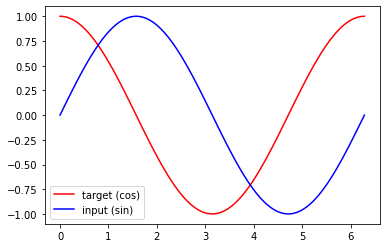

RNN(
  (rnn): RNN(1, 32, batch_first=True)
  (out): Linear(in_features=32, out_features=1, bias=True)
)


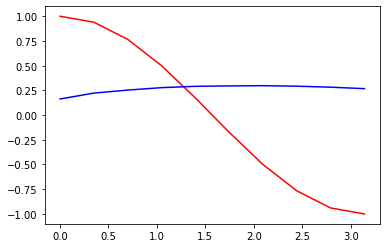

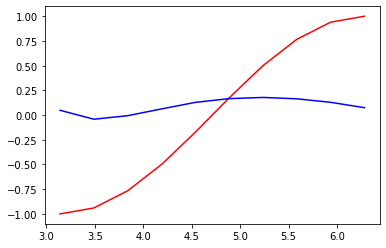

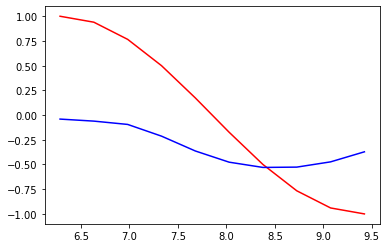

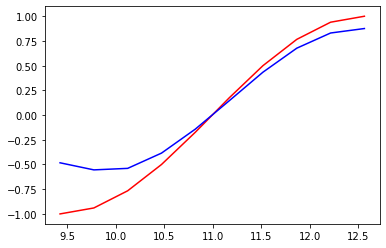

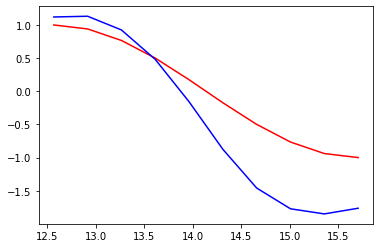

...

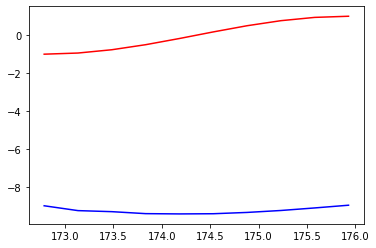

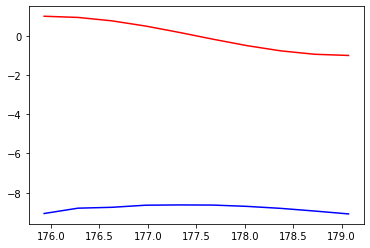

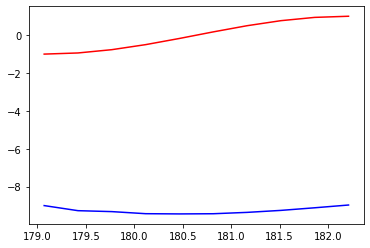

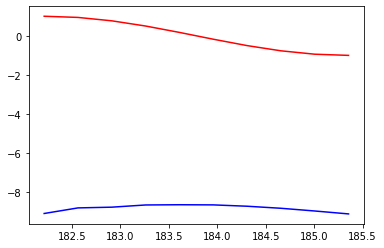

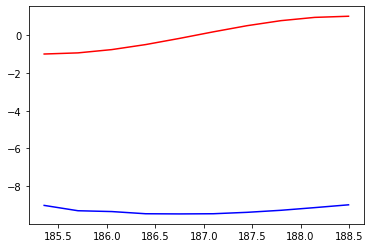

In [ ]:
import torch
from torch import nn
import numpy as np
import matplotlib.pyplot as plt
from torch.autograd import Variable

# torch.manual_seed(1)    # reproducible

# Hyper Parameters
TIME_STEP = 10      # rnn time step
INPUT_SIZE = 1      # rnn input size
LR = 0.02           # learning rate

# show data
steps = np.linspace(0, np.pi*2, 100, dtype=np.float32)  # float32 for converting torch FloatTensor
x_np = np.sin(steps)
y_np = np.cos(steps)
plt.plot(steps, y_np, 'r-', label='target (cos)')
plt.plot(steps, x_np, 'b-', label='input (sin)')
plt.legend(loc='best')
plt.show()

class RNN(nn.Module):
  def __init__(self):
    super(RNN, self).__init__()

    self.rnn = nn.RNN(
        input_size = INPUT_SIZE,
        hidden_size = 32,
        num_layers = 1,
        batch_first = True
    )
    self.out = nn.Linear(32, 1)
  def forward(self, x, h_state):
    r_out, h_state = self.rnn(x, h_state)
    outs = []
    for time_step in range(r_out.size(1)):
      outs.append(self.out(r_out[:, time_step, :]))

    return torch.stack(outs, dim=1), h_state


rnn = RNN()
print(rnn)

optimizer = torch.optim.Adam(rnn.parameters(), lr = LR)
loss_func = nn.CrossEntropyLoss()

h_state = None

for step in range(60):
  start, end = step*np.pi, (step+1)*np.pi
  steps = np.linspace(start, end, TIME_STEP, dtype = np.float32)
  x_np = np.sin(steps)
  y_np = np.cos(steps)

  x = Variable(torch.from_numpy(x_np[np.newaxis, :, np.newaxis]))
  y = Variable(torch.from_numpy(y_np[np.newaxis, :, np.newaxis]))

  prediction, h_state = rnn(x, h_state)
  h_state = Variable(h_state.data)

  loss = loss_func(prediction, y)
  optimizer.zero_grad()
  loss.backward()
  optimizer.step()

  # plotting
  plt.plot(steps, y_np.flatten(), 'r-')
  plt.plot(steps, prediction.data.numpy().flatten(), 'b-')
  plt.draw(); plt.pause(0.05)

plt.ioff()
plt.show()

###AutoEncoder

100%|██████████| 9912422/9912422 [00:00<00:00, 200239422.26it/s]

Extracting ./mnist/MNIST/raw/train-images-idx3-ubyte.gz to ./mnist/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 67863133.79it/s]


Extracting ./mnist/MNIST/raw/train-labels-idx1-ubyte.gz to ./mnist/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 52776143.50it/s]

Extracting ./mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to ./mnist/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 14575767.99it/s]


Extracting ./mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./mnist/MNIST/raw



/usr/local/lib/python3.10/dist-packages/torchvision/datasets/mnist.py:75: UserWarning: train_data has been renamed data
  warnings.warn("train_data has been renamed data")
/usr/local/lib/python3.10/dist-packages/torchvision/datasets/mnist.py:65: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")


torch.Size([60000, 28, 28])
torch.Size([60000])


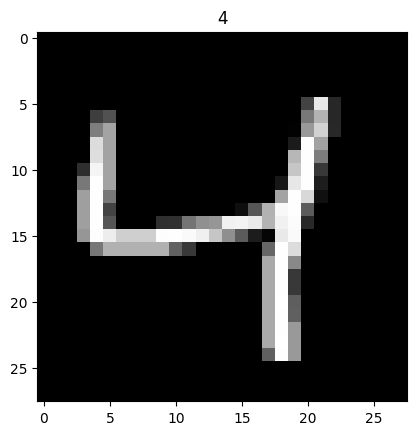

Epoch:  0 | train loss: 0.2333


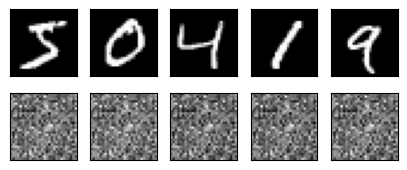

Epoch:  0 | train loss: 0.0698


<Figure size 640x480 with 0 Axes>

Epoch:  0 | train loss: 0.0653


<Figure size 640x480 with 0 Axes>

Epoch:  0 | train loss: 0.0567


<Figure size 640x480 with 0 Axes>

Epoch:  0 | train loss: 0.0542


<Figure size 640x480 with 0 Axes>

Epoch:  0 | train loss: 0.0534


<Figure size 640x480 with 0 Axes>

Epoch:  0 | train loss: 0.0513


<Figure size 640x480 with 0 Axes>

Epoch:  0 | train loss: 0.0478


<Figure size 640x480 with 0 Axes>

Epoch:  0 | train loss: 0.0442


<Figure size 640x480 with 0 Axes>

Epoch:  0 | train loss: 0.0480


<Figure size 640x480 with 0 Axes>

Epoch:  1 | train loss: 0.0503


<Figure size 640x480 with 0 Axes>

Epoch:  1 | train loss: 0.0477


<Figure size 640x480 with 0 Axes>

Epoch:  1 | train loss: 0.0455


<Figure size 640x480 with 0 Axes>

Epoch:  1 | train loss: 0.0452


<Figure size 640x480 with 0 Axes>

Epoch:  1 | train loss: 0.0474


<Figure size 640x480 with 0 Axes>

Epoch:  1 | train loss: 0.0413


<Figure size 640x480 with 0 Axes>

Epoch:  1 | train loss: 0.0451


<Figure size 640x480 with 0 Axes>

Epoch:  1 | train loss: 0.0410


<Figure size 640x480 with 0 Axes>

Epoch:  1 | train loss: 0.0384


<Figure size 640x480 with 0 Axes>

Epoch:  1 | train loss: 0.0430


<Figure size 640x480 with 0 Axes>

Epoch:  2 | train loss: 0.0415


<Figure size 640x480 with 0 Axes>

Epoch:  2 | train loss: 0.0399


<Figure size 640x480 with 0 Axes>

Epoch:  2 | train loss: 0.0376


<Figure size 640x480 with 0 Axes>

Epoch:  2 | train loss: 0.0376


<Figure size 640x480 with 0 Axes>

Epoch:  2 | train loss: 0.0399


<Figure size 640x480 with 0 Axes>

Epoch:  2 | train loss: 0.0376


<Figure size 640x480 with 0 Axes>

Epoch:  2 | train loss: 0.0402


<Figure size 640x480 with 0 Axes>

Epoch:  2 | train loss: 0.0413


<Figure size 640x480 with 0 Axes>

Epoch:  2 | train loss: 0.0372


<Figure size 640x480 with 0 Axes>

Epoch:  2 | train loss: 0.0414


<Figure size 640x480 with 0 Axes>

Epoch:  3 | train loss: 0.0396


<Figure size 640x480 with 0 Axes>

Epoch:  3 | train loss: 0.0372


<Figure size 640x480 with 0 Axes>

Epoch:  3 | train loss: 0.0375


<Figure size 640x480 with 0 Axes>

Epoch:  3 | train loss: 0.0371


<Figure size 640x480 with 0 Axes>

Epoch:  3 | train loss: 0.0368


<Figure size 640x480 with 0 Axes>

Epoch:  3 | train loss: 0.0376


<Figure size 640x480 with 0 Axes>

Epoch:  3 | train loss: 0.0379


<Figure size 640x480 with 0 Axes>

Epoch:  3 | train loss: 0.0355


<Figure size 640x480 with 0 Axes>

Epoch:  3 | train loss: 0.0387


<Figure size 640x480 with 0 Axes>

Epoch:  3 | train loss: 0.0381


<Figure size 640x480 with 0 Axes>

Epoch:  4 | train loss: 0.0356


<Figure size 640x480 with 0 Axes>

Epoch:  4 | train loss: 0.0331


<Figure size 640x480 with 0 Axes>

Epoch:  4 | train loss: 0.0341


<Figure size 640x480 with 0 Axes>

Epoch:  4 | train loss: 0.0393


<Figure size 640x480 with 0 Axes>

Epoch:  4 | train loss: 0.0378


<Figure size 640x480 with 0 Axes>

Epoch:  4 | train loss: 0.0368


<Figure size 640x480 with 0 Axes>

Epoch:  4 | train loss: 0.0337


<Figure size 640x480 with 0 Axes>

Epoch:  4 | train loss: 0.0357


<Figure size 640x480 with 0 Axes>

Epoch:  4 | train loss: 0.0345


<Figure size 640x480 with 0 Axes>

Epoch:  4 | train loss: 0.0375


<Figure size 640x480 with 0 Axes>

Epoch:  5 | train loss: 0.0390


<Figure size 640x480 with 0 Axes>

Epoch:  5 | train loss: 0.0374


<Figure size 640x480 with 0 Axes>

Epoch:  5 | train loss: 0.0393


<Figure size 640x480 with 0 Axes>

Epoch:  5 | train loss: 0.0380


<Figure size 640x480 with 0 Axes>

Epoch:  5 | train loss: 0.0361


<Figure size 640x480 with 0 Axes>

Epoch:  5 | train loss: 0.0364


<Figure size 640x480 with 0 Axes>

KeyboardInterrupt: ignored

In [ ]:
import torch
import torch.nn as nn
import torch.utils.data as Data
import torchvision
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import numpy as np


# torch.manual_seed(1)    # reproducible

# Hyper Parameters
EPOCH = 10
BATCH_SIZE = 64
LR = 0.005         # learning rate
DOWNLOAD_MNIST = True
N_TEST_IMG = 5

# Mnist digits dataset
train_data = torchvision.datasets.MNIST(
    root='./mnist/',
    train=True,                                     # this is training data
    transform=torchvision.transforms.ToTensor(),    # Converts a PIL.Image or numpy.ndarray to
                                                    # torch.FloatTensor of shape (C x H x W) and normalize in the range [0.0, 1.0]
    download=DOWNLOAD_MNIST,                        # download it if you don't have it
)

# plot one example
print(train_data.train_data.size())     # (60000, 28, 28)
print(train_data.train_labels.size())   # (60000)
plt.imshow(train_data.train_data[2].numpy(), cmap='gray')
plt.title('%i' % train_data.train_labels[2])
plt.show()

# Data Loader for easy mini-batch return in training, the image batch shape will be (50, 1, 28, 28)
train_loader = Data.DataLoader(dataset=train_data, batch_size=BATCH_SIZE, shuffle=True)


class AutoEncoder(nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()

        self.encoder = nn.Sequential(
            nn.Linear(28*28, 128),
            nn.Tanh(),
            nn.Linear(128, 64),
            nn.Tanh(),
            nn.Linear(64, 12),
            nn.Tanh(),
            nn.Linear(12, 3),   # compress to 3 features which can be visualized in plt
        )
        self.decoder = nn.Sequential(
            nn.Linear(3, 12),
            nn.Tanh(),
            nn.Linear(12, 64),
            nn.Tanh(),
            nn.Linear(64, 128),
            nn.Tanh(),
            nn.Linear(128, 28*28),
            nn.Sigmoid(),       # compress to a range (0, 1)
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded


autoencoder = AutoEncoder()

optimizer = torch.optim.Adam(autoencoder.parameters(), lr=LR)
loss_func = nn.MSELoss()

# initialize figure
f, a = plt.subplots(2, N_TEST_IMG, figsize=(5, 2))
plt.ion()   # continuously plot

# original data (first row) for viewing
view_data = train_data.train_data[:N_TEST_IMG].view(-1, 28*28).type(torch.FloatTensor)/255.
for i in range(N_TEST_IMG):
    a[0][i].imshow(np.reshape(view_data.data.numpy()[i], (28, 28)), cmap='gray'); a[0][i].set_xticks(()); a[0][i].set_yticks(())

for epoch in range(EPOCH):
    for step, (x, b_label) in enumerate(train_loader):
        b_x = x.view(-1, 28*28)   # batch x, shape (batch, 28*28)
        b_y = x.view(-1, 28*28)   # batch y, shape (batch, 28*28)

        encoded, decoded = autoencoder(b_x)

        loss = loss_func(decoded, b_y)      # mean square error
        optimizer.zero_grad()               # clear gradients for this training step
        loss.backward()                     # backpropagation, compute gradients
        optimizer.step()                    # apply gradients

        if step % 100 == 0:
            print('Epoch: ', epoch, '| train loss: %.4f' % loss.data.numpy())

            # plotting decoded image (second row)
            _, decoded_data = autoencoder(view_data)
            for i in range(N_TEST_IMG):
                a[1][i].clear()
                a[1][i].imshow(np.reshape(decoded_data.data.numpy()[i], (28, 28)), cmap='gray')
                a[1][i].set_xticks(()); a[1][i].set_yticks(())
            plt.draw(); plt.pause(0.05)

plt.ioff()
plt.show()

# visualize in 3D plot
view_data = train_data.train_data[:200].view(-1, 28*28).type(torch.FloatTensor)/255.
encoded_data, _ = autoencoder(view_data)
fig = plt.figure(2); ax = Axes3D(fig)
X, Y, Z = encoded_data.data[:, 0].numpy(), encoded_data.data[:, 1].numpy(), encoded_data.data[:, 2].numpy()
values = train_data.train_labels[:200].numpy()
for x, y, z, s in zip(X, Y, Z, values):
    c = cm.rainbow(int(255*s/9)); ax.text(x, y, z, s, backgroundcolor=c)
ax.set_xlim(X.min(), X.max()); ax.set_ylim(Y.min(), Y.max()); ax.set_zlim(Z.min(), Z.max())
plt.show()

###DQN

In [ ]:
!pip install gym
!pip install gym[classic_control]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 18.3 MB 91 kB/s 


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import gym

# Hyper Parameters
BATCH_SIZE = 32
LR = 0.01                   # learning rate
EPSILON = 0.9               # greedy policy
GAMMA = 0.9                 # reward discount
TARGET_REPLACE_ITER = 100   # target update frequency
MEMORY_CAPACITY = 2000
env = gym.make('CartPole-v0')
env = env.unwrapped
N_ACTIONS = env.action_space.n
N_STATES = env.observation_space.shape[0]
ENV_A_SHAPE = 0 if isinstance(env.action_space.sample(), int) else env.action_space.sample().shape     # to confirm the shape


class Net(nn.Module):
    def __init__(self, ):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(N_STATES, 50)
        self.fc1.weight.data.normal_(0, 0.1)   # initialization
        self.out = nn.Linear(50, N_ACTIONS)
        self.out.weight.data.normal_(0, 0.1)   # initialization

    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)
        actions_value = self.out(x)
        return actions_value


class DQN(object):
    def __init__(self):
        self.eval_net, self.target_net = Net(), Net()

        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)
        self.loss_func = nn.MSELoss()

    def choose_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        # input only one sample
        if np.random.uniform() < EPSILON:   # greedy
            actions_value = self.eval_net.forward(x)
            action = torch.max(actions_value, 1)[1].data.numpy()
            action = action[0] if ENV_A_SHAPE == 0 else action.reshape(ENV_A_SHAPE)  # return the argmax index
        else:   # random
            action = np.random.randint(0, N_ACTIONS)
            action = action if ENV_A_SHAPE == 0 else action.reshape(ENV_A_SHAPE)
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])

        # q_eval w.r.t the action in experience
        q_eval = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        q_next = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.max(1)[0].view(BATCH_SIZE, 1)   # shape (batch, 1)
        loss = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

dqn = DQN()

print('\nCollecting experience...')
for i_episode in range(400):
    s = env.reset()
    ep_r = 0
    while True:
        env.render()
        a = dqn.choose_action(s)

        # take action
        s_, r, done, info = env.step(a)

        # modify the reward
        x, x_dot, theta, theta_dot = s_
        r1 = (env.x_threshold - abs(x)) / env.x_threshold - 0.8
        r2 = (env.theta_threshold_radians - abs(theta)) / env.theta_threshold_radians - 0.5
        r = r1 + r2

        dqn.store_transition(s, a, r, s_)

        ep_r += r
        if dqn.memory_counter > MEMORY_CAPACITY:
            dqn.learn()
            if done:
                print('Ep: ', i_episode,
                      '| Ep_r: ', round(ep_r, 2))

        if done:
            break
        s = s_

/usr/local/lib/python3.10/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/core.py:49: DeprecationWarning: WARN: You are calling render method, but you didn't specified the argument render_mode at environment initialization. To mainta

error: ignored

###GAN

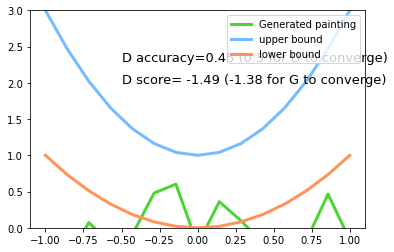

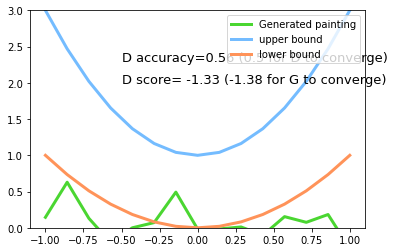

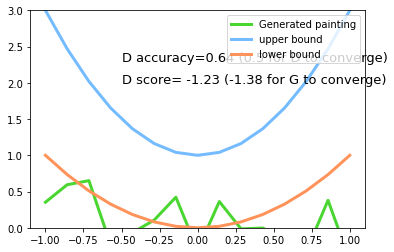

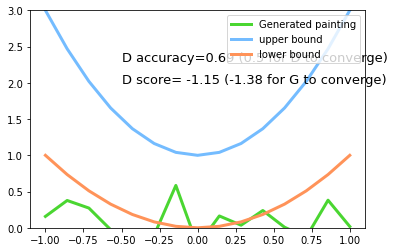

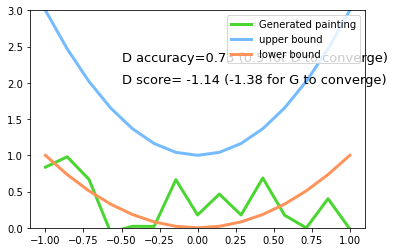

...

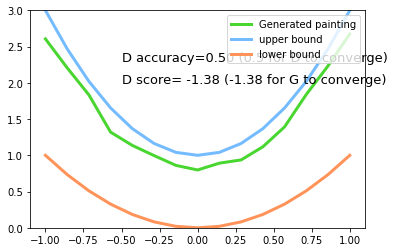

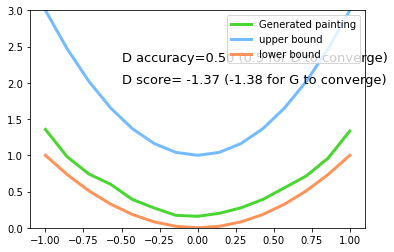

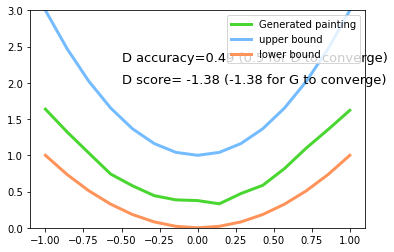

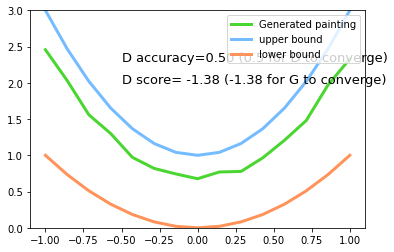

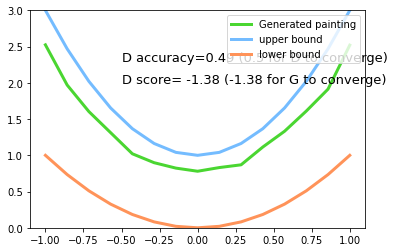

In [ ]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt

# torch.manual_seed(1)    # reproducible
# np.random.seed(1)

# Hyper Parameters
BATCH_SIZE = 64
LR_G = 0.0001           # learning rate for generator
LR_D = 0.0001           # learning rate for discriminator
N_IDEAS = 5             # think of this as number of ideas for generating an art work (Generator)
ART_COMPONENTS = 15     # it could be total point G can draw in the canvas
PAINT_POINTS = np.vstack([np.linspace(-1, 1, ART_COMPONENTS) for _ in range(BATCH_SIZE)])

# show our beautiful painting range
# plt.plot(PAINT_POINTS[0], 2 * np.power(PAINT_POINTS[0], 2) + 1, c='#74BCFF', lw=3, label='upper bound')
# plt.plot(PAINT_POINTS[0], 1 * np.power(PAINT_POINTS[0], 2) + 0, c='#FF9359', lw=3, label='lower bound')
# plt.legend(loc='upper right')
# plt.show()


def artist_works():     # painting from the famous artist (real target)
    a = np.random.uniform(1, 2, size=BATCH_SIZE)[:, np.newaxis]
    paintings = a * np.power(PAINT_POINTS, 2) + (a-1)
    paintings = torch.from_numpy(paintings).float()
    return paintings

G = nn.Sequential(                      # Generator
    nn.Linear(N_IDEAS, 128),            # random ideas (could from normal distribution)
    nn.ReLU(),
    nn.Linear(128, ART_COMPONENTS),     # making a painting from these random ideas
)

D = nn.Sequential(                      # Discriminator
    nn.Linear(ART_COMPONENTS, 128),     # receive art work either from the famous artist or a newbie like G
    nn.ReLU(),
    nn.Linear(128, 1),
    nn.Sigmoid(),                       # tell the probability that the art work is made by artist
)

opt_D = torch.optim.Adam(D.parameters(), lr=LR_D)
opt_G = torch.optim.Adam(G.parameters(), lr=LR_G)

plt.ion()   # something about continuous plotting

for step in range(10000):
    artist_paintings = artist_works()  # real painting from artist
    G_ideas = torch.randn(BATCH_SIZE, N_IDEAS, requires_grad=True)  # random ideas\n
    G_paintings = G(G_ideas)                    # fake painting from G (random ideas)
    prob_artist1 = D(G_paintings)               # D try to reduce this prob
    G_loss = torch.mean(torch.log(1. - prob_artist1))
    opt_G.zero_grad()
    G_loss.backward()
    opt_G.step()

    prob_artist0 = D(artist_paintings)          # D try to increase this prob
    prob_artist1 = D(G_paintings.detach())  # D try to reduce this prob
    D_loss = - torch.mean(torch.log(prob_artist0) + torch.log(1. - prob_artist1))
    opt_D.zero_grad()
    D_loss.backward(retain_graph=True)      # reusing computational graph
    opt_D.step()

    if step % 50 == 0:  # plotting
        plt.cla()
        plt.plot(PAINT_POINTS[0], G_paintings.data.numpy()[0], c='#4AD631', lw=3, label='Generated painting',)
        plt.plot(PAINT_POINTS[0], 2 * np.power(PAINT_POINTS[0], 2) + 1, c='#74BCFF', lw=3, label='upper bound')
        plt.plot(PAINT_POINTS[0], 1 * np.power(PAINT_POINTS[0], 2) + 0, c='#FF9359', lw=3, label='lower bound')
        plt.text(-.5, 2.3, 'D accuracy=%.2f (0.5 for D to converge)' % prob_artist0.data.numpy().mean(), fontdict={'size': 13})
        plt.text(-.5, 2, 'D score= %.2f (-1.38 for G to converge)' % -D_loss.data.numpy(), fontdict={'size': 13})
        plt.ylim((0, 3));plt.legend(loc='upper right', fontsize=10);plt.draw();plt.pause(0.01)

plt.ioff()
plt.show()